In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib
import pandas as pd
%matplotlib inline
import re
from skimage import io, exposure
from matplotlib import pyplot as plt
matplotlib.rcParams.update({'font.size': 20})

In [9]:
import fnmatch 
import os 
files = []
for root, dirnames, filenames in os.walk('data/BaltimoreLandsatSummer2015'): #('/Users/ascott47/Desktop/bda/BaltimoreLandsatSummer2015'): 
    for filename in fnmatch.filter(filenames, '*B10.TIF'): 
        files.append(os.path.join(root, filename))    

In [12]:
files
file = files[4]

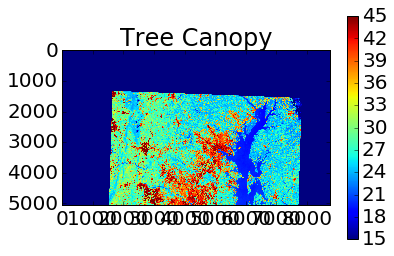

In [26]:
from osgeo import ogr, osr
import gdal
rasterfile = 'data/atm_cor_10_LC80150332015229.tif'#'data/TreeBaltimore_CanopyCover.img'

layer = gdal.Open(rasterfile)
gt =layer.GetGeoTransform()
src = layer.GetRasterBand(1)
data = src.ReadAsArray()
plt.imshow(data, vmin = 15, vmax = 45)
plt.title('Tree Canopy')
plt.colorbar()

In [60]:
def prettify_plot(): 
    ""'Hides top and rightmos axis spines and also some other stuff. '""
    figures = [x for x in matplotlib._pylab_helpers.Gcf.get_all_fig_managers()]
    for figure in figures:
        # Get all Axis instances related to the figure.
        for ax in figure.canvas.figure.get_axes():
            # Disable spines.
            ax.spines['right'].set_color('none')
            ax.spines['left'].set_color('none')
            ax.spines['top'].set_color('none')
            # Disable ticks.
            ax.xaxis.set_ticks_position('bottom')
            ax.yaxis.set_ticks_position('left')

    ax.spines["top"].set_visible(False)  
    ax.spines["right"].set_visible(False)
    ax.set_axis_bgcolor('none')
    plt.grid(b=False, which='major')
    
def scale_bar(ax, length, location=(0.5, 0.05), linewidth=3):
    """
    ax is the axes to draw the scalebar on.
    location is center of the scalebar in axis coordinates ie. 0.5 is the middle of the plot
    length is the length of the scalebar in km.
    linewidth is the thickness of the scalebar.
    """
    #Projection in metres, need to change this to suit your own figure
    utm = ccrs.UTM(18)
    #Get the extent of the plotted area in coordinates in metres
    x0, x1, y0, y1 = ax.get_extent(utm)
    #Turn the specified scalebar location into coordinates in metres
    sbcx, sbcy = x0 + (x1 - x0) * location[0], y0 + (y1 - y0) * location[1]
    #Generate the x coordinate for the ends of the scalebar
    bar_xs = [sbcx - length * 500, sbcx + length * 500]
    #Plot the scalebar
    ax.plot(bar_xs, [sbcy, sbcy], transform=utm, color='k', linewidth=linewidth)
    #Plot the scalebar label
    ax.text(sbcx, sbcy, str(length) + ' km', transform=utm,
            horizontalalignment='center', verticalalignment='bottom')
#scale_bar(ax,1)

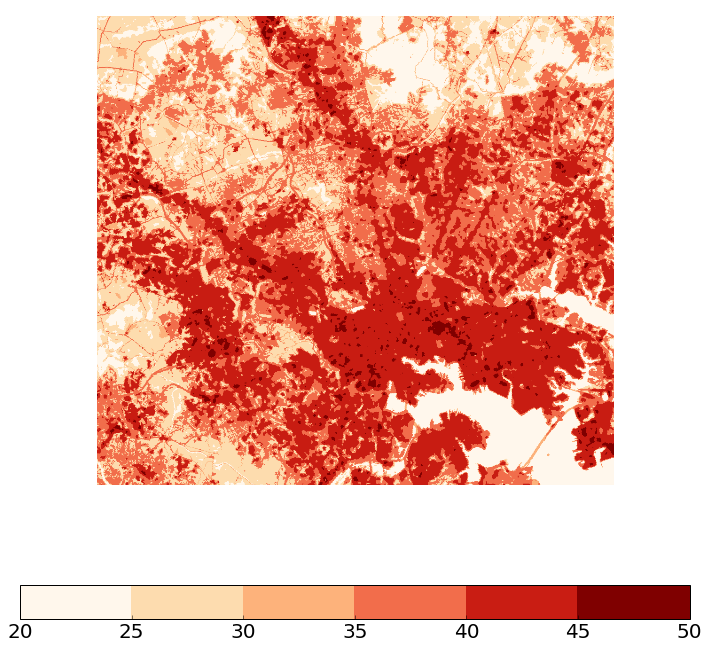

In [66]:
plt.figure(figsize = [12,12])
import matplotlib as mpl
import cartopy.crs as ccrs
cmap = matplotlib.cm.OrRd
bounds = np.linspace(20,50,7)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

ax = plt.imshow(data[2500:3500, 4400:5500], vmin = 20, vmax = 50, cmap = cmap, norm = norm)
plt.colorbar(orientation= 'horizontal')
plt.axis('off')
#scale_bar(ax,1)
plt.savefig('landsat2292015atmcorrected.eps')

In [80]:
sorted(cfeature.COLORS.keys())

['land', 'land_alt1', 'water']

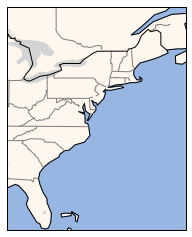

In [118]:
import cartopy.crs as ccrs
#import matplotlib.pyplot as plt
import cartopy.feature as cfeature

ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-85, -65, 25, 50])
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

ax.add_feature(cfeature.LAND, facecolor = '#fff7ed')
ax.add_feature(cfeature.LAKES, facecolor = 'lightgray')
ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE, edgecolor ='black')
ax.add_feature(states_provinces, edgecolor='gray')
ax.add_feature(cfeature.BORDERS, edgecolor = 'black')

#plt.show()
plt.savefig('backgroundmap.eps')


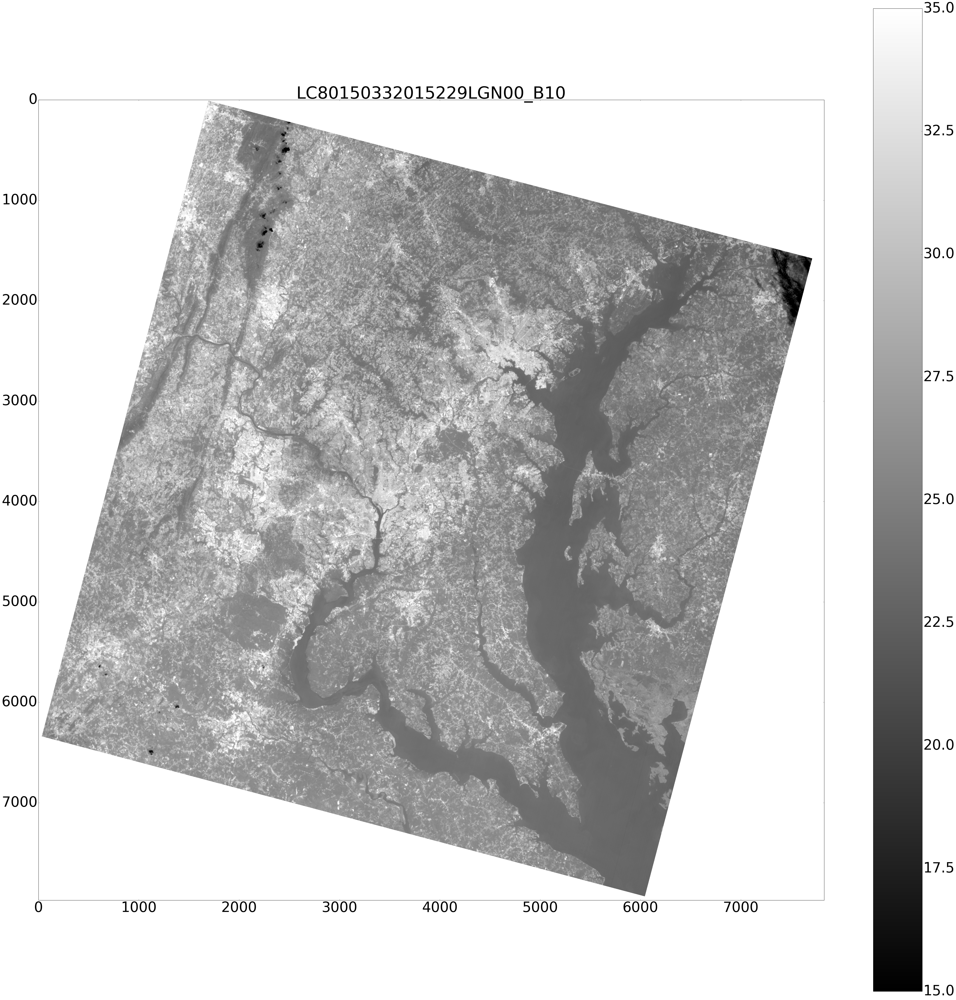

In [4]:
band10file = file
title = os.path.splitext(os.path.basename(file))[0]
band10 = mpimg.imread(band10file)
# convert from digital numbers to (spectral) radiance
m_l = 3.3420E-04 # gain
a_l = 0.10000 # bias
radiance = m_l * band10 + a_l
# convert from radiance to temperature by inverting the planck function
k1 = 774.8853 
k2 = 1321.0789
temp = k2/ (np.log(k1/radiance +1)) -273.15
temp[temp < -100] = 'nan'
matplotlib.rcParams.update({'font.size': 60})
fig  = plt.figure(figsize=(75, 75))
imgplot = plt.imshow(temp, 
                         cmap = 'gray', #matplotlib.cm.RdBu_r, #matplotlib.cm.OrRd,
                         vmin = 15,
                         vmax = 35,
                         )
plt.colorbar()
plt.title(title)
#plt.savefig('LSTcolorbar%s.eps'%title)

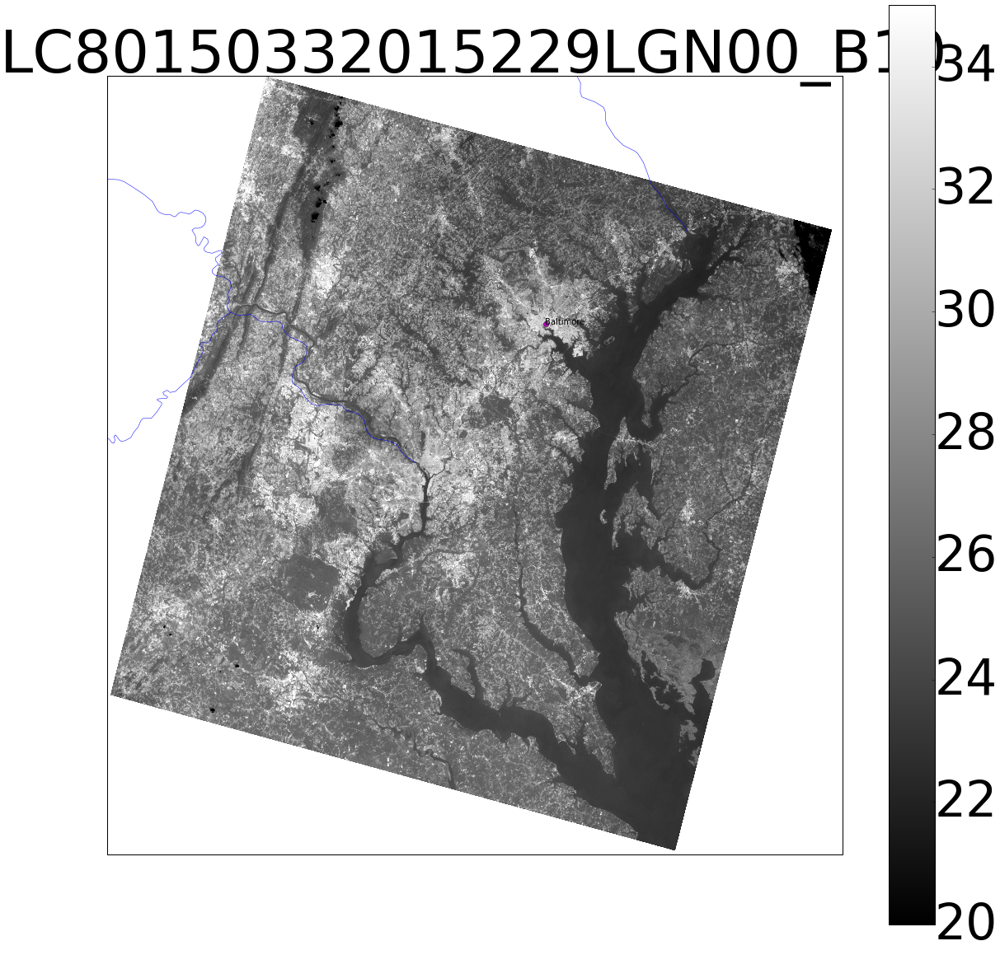

In [21]:
fig = plt.figure(figsize=[20,20])
lllon = -78.15719
lllat = 37.79440
urlon = -75.50134 
urlat = 39.99029

m = Basemap(llcrnrlon  = lllon, 
            llcrnrlat  = lllat, 
            urcrnrlon  = urlon, 
            urcrnrlat  = urlat,
            projection = 'tmerc', 
            lat_0 = (lllat+urlat)*.5, 
            lon_0 = (lllon+urlon)*.5, 
            resolution = 'h',
            )

m.drawrivers(color = 'blue')
m.drawcountries()
x,y = m( -76.592488, 39.297232)
m.plot(x,y, marker = 'o', color = 'm', )
plt.annotate('Baltimore', xy = (x,y), xycoords = 'data', fontsize = 10)

#x,y = m(36.924841, -1.323374 )
#m.plot(x,y, marker = 'o', color = 'g')
#plt.annotate('Airport', xy = (x,y), xycoords = 'data', fontsize = 10)

x, y = m((lllon, urlon), (lllat, urlat))
m.imshow(temp, cmap = 'gray', #matplotlib.cm.RdBu_r,#
        vmin = 20,
        vmax = 35,
        origin = 'upper'
         #extent = [x[0], x[1], y[0], y[1]],
         )
plt.colorbar()
title = os.path.splitext(os.path.basename(file))[0]
plt.title(title)
#plt.savefig('LSTcolorbarNairobi.eps')

In [8]:
# from http://invisibleroads.com/tutorials/gdal-raster-extract.html
import struct, numpy, pylab

def extractWindow(pixelX, pixelY, pixelWidth, pixelHeight):
    # Extract raw data
    band = imageDataset.GetRasterBand(1)
    #byteString = band.ReadRaster(pixelX, pixelY, pixelWidth, pixelHeight)
    # Convert to a matrix
    #valueType = {osgeo.gdal.GDT_Byte: 'B', osgeo.gdal.GDT_UInt16: 'H'}[band.DataType]
    values = band.ReadAsArray(pixelX, pixelY,pixelWidth, pixelHeight)
    #values = struct.unpack('%d%s' % (pixelWidth * pixelHeight, valueType), byteString)
    matrix = numpy.reshape(values, (pixelWidth, pixelHeight))
    
    # Display matrix
    pylab.imshow(matrix, cmap=pylab.cm.gray)
    pylab.show()
    # Return
    return matrix

def extractCenteredWindow(pixelX, pixelY, pixelWidth, pixelHeight):
    centeredPixelX = pixelX - pixelWidth / 2
    centeredPixelY = pixelY - pixelHeight / 2
    return extractWindow(centeredPixelX, centeredPixelY, pixelWidth, pixelHeight)

def convertGeoLocationToPixelLocation(geoLocation):
    xGeo, yGeo = geoLocation
    if g2 == 0:
        xPixel = (xGeo - g0) / float(g1)
        yPixel = (yGeo - g3 - xPixel*g4) / float(g5)
    else:
        xPixel = (yGeo*g2 - xGeo*g5 + g0*g5 - g2*g3) / float(g2*g4 - g1*g5)
        yPixel = (xGeo - g0 - xPixel*g1) / float(g2)
    return int(round(xPixel)), int(round(yPixel))

def convertGeoDimensionsToPixelDimensions(geoWidth, geoHeight):
    return int(round(abs(float(geoWidth) / g1))), int(round(abs(float(geoHeight) / g5)))

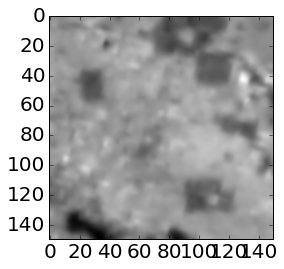

In [9]:
import osgeo.gdal
# UTM coordinates for Patt Park
#xxx = 363858.4
#yyy = 4350191.7 
# Center of study area: 39.3012743 N, -76.5899176 E
xxx = 362908.5 
yyy = 4351415.1 

imageDataset = osgeo.gdal.Open(file)
g0, g1, g2, g3, g4, g5 = imageDataset.GetGeoTransform()
#band = imageDataset.GetRasterBand(1)
#values = band.ReadAsArray(0,0, imageDataset.RasterXSize, imageDataset.RasterYSize)

pixelX, pixelY = convertGeoLocationToPixelLocation([xxx,yyy])
#pixelWidth, pixelHeight = convertGeoDimensionsToPixelDimensions(100, 100)
matrix = extractCenteredWindow(pixelX, pixelY, 150, 150)

m_l = 3.3420E-04 # gain
a_l = 0.10000 # bias
radiance = m_l * matrix + a_l
# convert from radiance to temperature by inverting the planck function
k1 = 774.8853 
k2 = 1321.0789
temp = k2/ (np.log(k1/radiance +1)) -273.15

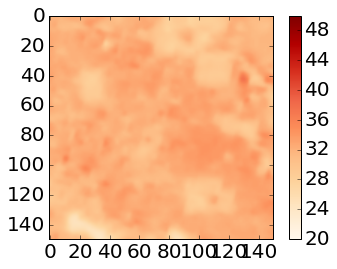

In [10]:
pylab.imshow(temp, cmap = matplotlib.cm.OrRd, vmin=20, vmax = 50)
plt.colorbar()

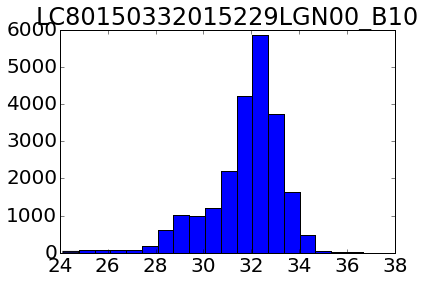

In [36]:
n, bins, patches = plt.hist(temp[:].reshape([temp.shape[0]*temp.shape[1]]),20)
title = os.path.splitext(os.path.basename(file))[0]
plt.title(title)

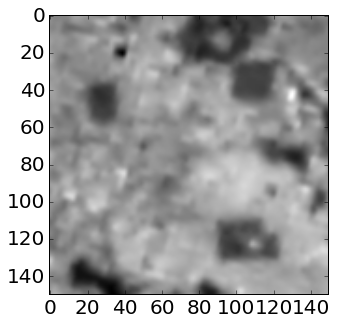

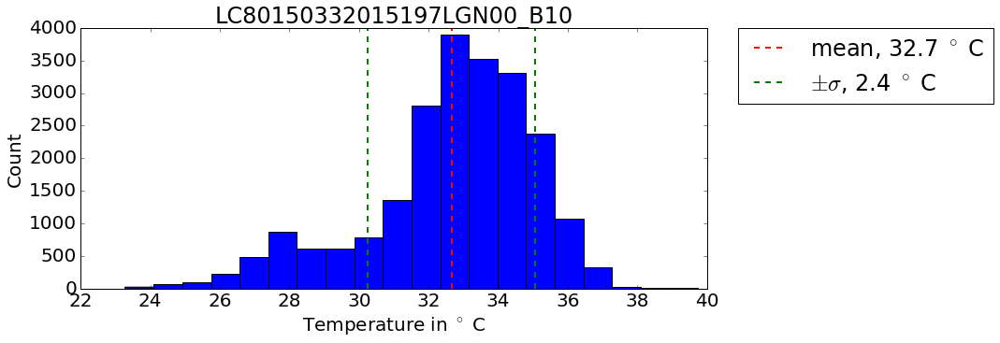

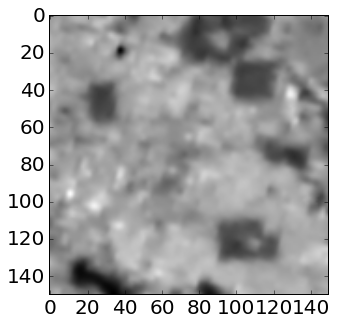

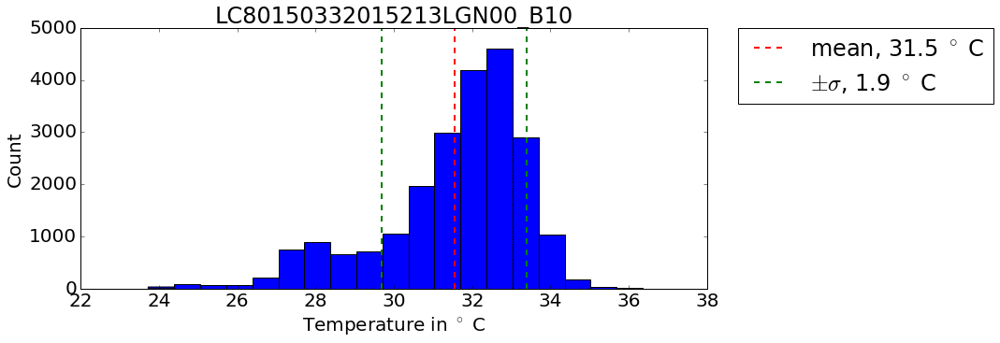

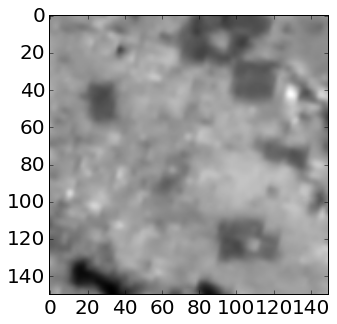

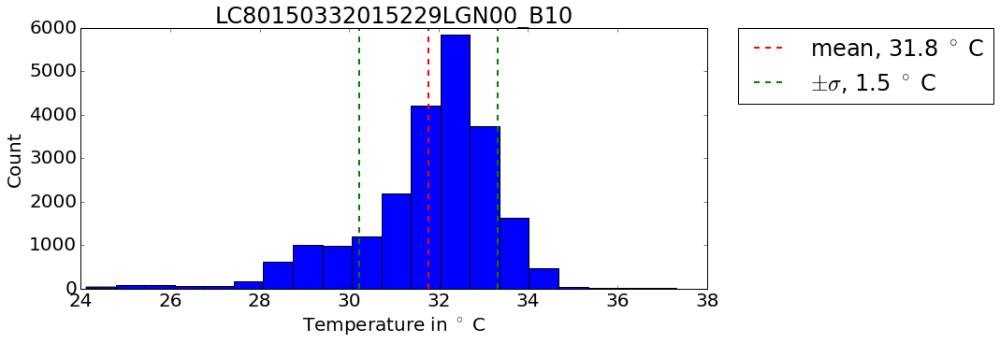

In [10]:
matplotlib.rcParams.update({'font.size': 20})
m_l = 3.3420E-04 # gain
a_l = 0.10000 # bias
# convert from radiance to temperature by inverting the planck function
k1 = 774.8853 
k2 = 1321.0789
xxx = 362908.5 
yyy = 4351415.1 

for file in files[2:5]: 
    imageDataset = osgeo.gdal.Open(file)
    g0, g1, g2, g3, g4, g5 = imageDataset.GetGeoTransform()
    pixelX, pixelY = convertGeoLocationToPixelLocation([xxx,yyy])
    
    figure = plt.figure(figsize=[5,5])
    matrix = extractCenteredWindow(pixelX, pixelY, 150, 150)
    
    figure = plt.figure(figsize=[12,5])
    radiance = m_l * matrix + a_l
    temp = k2/ (np.log(k1/radiance +1)) -273.15
    n, bins, patches = plt.hist(temp[:].reshape([temp.shape[0]*temp.shape[1]]),20
                        )
    plt.axvline(temp.mean(),
                linestyle='dashed',
                color = pd.tools.plotting._get_standard_colors(3)[2],
                linewidth=2,
                label = 'mean, %2.1f $^\circ$ C'%temp.mean(),
                alpha = 1.0)

    plt.axvline(temp.std()+temp.mean(),
                color = pd.tools.plotting._get_standard_colors(3)[1],
                linestyle='dashed',
                linewidth=2,
                label = '$\pm \sigma$, %2.1f $^\circ$ C'%temp.std()
                )

    plt.axvline(temp.mean()-temp.std(),
                color = pd.tools.plotting._get_standard_colors(3)[1],
                linestyle='dashed',
                linewidth=2,
                )
    plt.xlabel('Temperature in $^\circ$ C')
    plt.ylabel('Count')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) #, ncol = 3)
    title = os.path.splitext(os.path.basename(file))[0]
    plt.title(title)
